# Install Modules

# Imports

In [4]:
# 1. Basic Python Imports
import pandas as pd
import numpy as np
import os
from MCForecastTools import MCSimulation
from pathlib import Path

# 2. API PULL|
from requests import Request, Session
from requests.exceptions import ConnectionError, Timeout, TooManyRedirects
import json
from defillama import DefiLlama

# 3. API Keys
from dotenv import load_dotenv

# 4. Panadas_Datareader
import pandas_datareader.data as web
from pandas_datareader import data, wb
import pandas_datareader as pdr

# 5. Date Time
import datetime as dt
from datetime import datetime

# 6. Plotting
import plotly
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import hvplot.pandas 
import hvplot.dask 


In [5]:
# Importing the api

import coinmarketcapapi

cmc = coinmarketcapapi.CoinMarketCapAPI('3486d5cf-6e5b-443f-8f9a-140421f63bb3')

In [6]:
# Changing scientific notation of values in table 

pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [7]:
# api pull
data_listing = cmc.cryptocurrency_listings_latest(convert='USD')

In [8]:
# create df and narrow columns
df = pd.DataFrame.from_dict(data_listing.data)

df = df[['name', 'symbol', 'date_added', 'quote']]
df

,name,symbol,date_added,quote
0,Bitcoin,BTC,2013-04-28T00:00:00.000Z,"{'USD': {'price': 29469.592346147332, 'volume_..."
1,Ethereum,ETH,2015-08-07T00:00:00.000Z,"{'USD': {'price': 2013.5033257328125, 'volume_..."
2,Tether,USDT,2015-02-25T00:00:00.000Z,"{'USD': {'price': 0.9986553433190679, 'volume_..."
3,USD Coin,USDC,2018-10-08T00:00:00.000Z,"{'USD': {'price': 1.0003491899306283, 'volume_..."
4,BNB,BNB,2017-07-25T00:00:00.000Z,"{'USD': {'price': 287.84413340814257, 'volume_..."
...,...,...,...,...
95,Qtum,QTUM,2017-05-24T00:00:00.000Z,"{'USD': {'price': 3.894899105019706, 'volume_2..."
96,Kava,KAVA,2019-10-25T00:00:00.000Z,"{'USD': {'price': 2.086530944298908, 'volume_2..."
97,1inch Network,1INCH,2020-12-25T00:00:00.000Z,"{'USD': {'price': 0.9341487065273281, 'volume_..."
98,Bancor,BNT,2017-06-18T00:00:00.000Z,"{'USD': {'price': 1.3848918356533415, 'volume_..."


In [9]:
# isolate quotes column for expansion into columns
quotes_df = df[['name', 'quote']].copy()
df = df.drop(columns = ['quote'])

In [10]:
# expand into columns
usd = quotes_df["quote"].apply(pd.Series)
price = usd['USD'].apply(pd.Series)

In [11]:
# concat for final df
crypto_df = pd.concat([df, price], axis = 1, join = 'inner')

crypto_df.head(10)

,name,symbol,date_added,price,volume_24h,volume_change_24h,percent_change_1h,percent_change_24h,percent_change_7d,percent_change_30d,percent_change_60d,percent_change_90d,market_cap,market_cap_dominance,fully_diluted_market_cap,last_updated
0,Bitcoin,BTC,2013-04-28T00:00:00.000Z,29469.592,29575640891.975,-33.052,1.737,-1.929,-17.967,-26.292,-24.708,-30.242,561095881091.985,44.553,618861439269.090,2022-05-14T17:30:00.000Z
1,Ethereum,ETH,2015-08-07T00:00:00.000Z,2013.503,16996090565.505,-35.663,1.430,-2.943,-25.086,-33.225,-22.194,-30.171,243183635247.319,19.300,243183635247.320,2022-05-14T17:29:00.000Z
2,Tether,USDT,2015-02-25T00:00:00.000Z,0.999,61561788062.166,-31.580,0.046,-0.016,-0.130,-0.154,-0.170,-0.183,76605005246.959,6.083,79606435215.910,2022-05-14T17:29:00.000Z
3,USD Coin,USDC,2018-10-08T00:00:00.000Z,1.000,5820524050.474,-34.307,-0.024,0.025,0.019,0.087,0.078,0.130,50952351446.983,4.046,50952351446.980,2022-05-14T17:29:00.000Z
4,BNB,BNB,2017-07-25T00:00:00.000Z,287.844,2020529701.347,-30.955,2.000,-3.010,-23.570,-30.464,-22.137,-27.781,46998319267.876,3.730,47527890693.360,2022-05-14T17:29:00.000Z
5,XRP,XRP,2013-08-04T00:00:00.000Z,0.417,2077963580.384,-32.828,2.062,-2.992,-29.915,-42.040,-45.316,-48.463,20154392026.286,1.600,41690316771.690,2022-05-14T17:30:00.000Z
6,Binance USD,BUSD,2019-09-20T00:00:00.000Z,1.000,11912973839.118,22.668,-0.188,-0.121,0.069,0.084,0.077,0.160,17514908231.609,1.391,17514908231.610,2022-05-14T17:29:00.000Z
7,Cardano,ADA,2017-10-01T00:00:00.000Z,0.518,1241829611.463,-39.511,3.186,-7.462,-33.209,-44.565,-35.446,-50.497,17474316997.598,1.387,23306665884.720,2022-05-14T17:29:00.000Z
8,Solana,SOL,2020-04-10T00:00:00.000Z,48.366,1975546856.676,-35.653,1.736,-8.201,-40.663,-51.715,-40.888,-48.169,16315076901.128,1.296,24745109142.900,2022-05-14T17:29:00.000Z
9,Dogecoin,DOGE,2013-12-15T00:00:00.000Z,0.088,930470682.742,-44.958,2.059,-2.618,-32.552,-38.718,-22.116,-42.936,11630126934.051,0.923,11630126934.050,2022-05-14T17:30:00.000Z


In [12]:
# Sorting values by largest market cap  

crypto_df.sort_values(by='market_cap', ascending=False).head(10)

,name,symbol,date_added,price,volume_24h,volume_change_24h,percent_change_1h,percent_change_24h,percent_change_7d,percent_change_30d,percent_change_60d,percent_change_90d,market_cap,market_cap_dominance,fully_diluted_market_cap,last_updated
0,Bitcoin,BTC,2013-04-28T00:00:00.000Z,29469.592,29575640891.975,-33.052,1.737,-1.929,-17.967,-26.292,-24.708,-30.242,561095881091.985,44.553,618861439269.090,2022-05-14T17:30:00.000Z
1,Ethereum,ETH,2015-08-07T00:00:00.000Z,2013.503,16996090565.505,-35.663,1.430,-2.943,-25.086,-33.225,-22.194,-30.171,243183635247.319,19.300,243183635247.320,2022-05-14T17:29:00.000Z
2,Tether,USDT,2015-02-25T00:00:00.000Z,0.999,61561788062.166,-31.580,0.046,-0.016,-0.130,-0.154,-0.170,-0.183,76605005246.959,6.083,79606435215.910,2022-05-14T17:29:00.000Z
3,USD Coin,USDC,2018-10-08T00:00:00.000Z,1.000,5820524050.474,-34.307,-0.024,0.025,0.019,0.087,0.078,0.130,50952351446.983,4.046,50952351446.980,2022-05-14T17:29:00.000Z
4,BNB,BNB,2017-07-25T00:00:00.000Z,287.844,2020529701.347,-30.955,2.000,-3.010,-23.570,-30.464,-22.137,-27.781,46998319267.876,3.730,47527890693.360,2022-05-14T17:29:00.000Z
5,XRP,XRP,2013-08-04T00:00:00.000Z,0.417,2077963580.384,-32.828,2.062,-2.992,-29.915,-42.040,-45.316,-48.463,20154392026.286,1.600,41690316771.690,2022-05-14T17:30:00.000Z
6,Binance USD,BUSD,2019-09-20T00:00:00.000Z,1.000,11912973839.118,22.668,-0.188,-0.121,0.069,0.084,0.077,0.160,17514908231.609,1.391,17514908231.610,2022-05-14T17:29:00.000Z
7,Cardano,ADA,2017-10-01T00:00:00.000Z,0.518,1241829611.463,-39.511,3.186,-7.462,-33.209,-44.565,-35.446,-50.497,17474316997.598,1.387,23306665884.720,2022-05-14T17:29:00.000Z
8,Solana,SOL,2020-04-10T00:00:00.000Z,48.366,1975546856.676,-35.653,1.736,-8.201,-40.663,-51.715,-40.888,-48.169,16315076901.128,1.296,24745109142.900,2022-05-14T17:29:00.000Z
9,Dogecoin,DOGE,2013-12-15T00:00:00.000Z,0.088,930470682.742,-44.958,2.059,-2.618,-32.552,-38.718,-22.116,-42.936,11630126934.051,0.923,11630126934.050,2022-05-14T17:30:00.000Z


In [14]:
crypto_df.loc['market_cap'] = crypto_df.loc[:, 'market_cap'].astype("float")

In [15]:
# checking data types

crypto_df.dtypes

name                         object
symbol                       object
date_added                   object
price                       float64
volume_24h                  float64
volume_change_24h           float64
percent_change_1h           float64
percent_change_24h          float64
percent_change_7d           float64
percent_change_30d          float64
percent_change_60d          float64
percent_change_90d          float64
market_cap                  float64
market_cap_dominance        float64
fully_diluted_market_cap    float64
last_updated                 object
dtype: object

In [16]:
# Eliminate the coins under $15B market cap (had to lower this from 25B due to market volatility)  

crypto_df_sorted = crypto_df.loc[crypto_df['market_cap'] >= 15000000000].copy()
crypto_df_sorted.head(10)

,name,symbol,date_added,price,volume_24h,volume_change_24h,percent_change_1h,percent_change_24h,percent_change_7d,percent_change_30d,percent_change_60d,percent_change_90d,market_cap,market_cap_dominance,fully_diluted_market_cap,last_updated
0,Bitcoin,BTC,2013-04-28T00:00:00.000Z,29469.592,29575640891.975,-33.052,1.737,-1.929,-17.967,-26.292,-24.708,-30.242,561095881091.985,44.553,618861439269.090,2022-05-14T17:30:00.000Z
1,Ethereum,ETH,2015-08-07T00:00:00.000Z,2013.503,16996090565.505,-35.663,1.430,-2.943,-25.086,-33.225,-22.194,-30.171,243183635247.319,19.300,243183635247.320,2022-05-14T17:29:00.000Z
2,Tether,USDT,2015-02-25T00:00:00.000Z,0.999,61561788062.166,-31.580,0.046,-0.016,-0.130,-0.154,-0.170,-0.183,76605005246.959,6.083,79606435215.910,2022-05-14T17:29:00.000Z
3,USD Coin,USDC,2018-10-08T00:00:00.000Z,1.000,5820524050.474,-34.307,-0.024,0.025,0.019,0.087,0.078,0.130,50952351446.983,4.046,50952351446.980,2022-05-14T17:29:00.000Z
4,BNB,BNB,2017-07-25T00:00:00.000Z,287.844,2020529701.347,-30.955,2.000,-3.010,-23.570,-30.464,-22.137,-27.781,46998319267.876,3.730,47527890693.360,2022-05-14T17:29:00.000Z
5,XRP,XRP,2013-08-04T00:00:00.000Z,0.417,2077963580.384,-32.828,2.062,-2.992,-29.915,-42.040,-45.316,-48.463,20154392026.286,1.600,41690316771.690,2022-05-14T17:30:00.000Z
6,Binance USD,BUSD,2019-09-20T00:00:00.000Z,1.000,11912973839.118,22.668,-0.188,-0.121,0.069,0.084,0.077,0.160,17514908231.609,1.391,17514908231.610,2022-05-14T17:29:00.000Z
7,Cardano,ADA,2017-10-01T00:00:00.000Z,0.518,1241829611.463,-39.511,3.186,-7.462,-33.209,-44.565,-35.446,-50.497,17474316997.598,1.387,23306665884.720,2022-05-14T17:29:00.000Z
8,Solana,SOL,2020-04-10T00:00:00.000Z,48.366,1975546856.676,-35.653,1.736,-8.201,-40.663,-51.715,-40.888,-48.169,16315076901.128,1.296,24745109142.900,2022-05-14T17:29:00.000Z


In [17]:
# Out of the remaining coins, eliminate coins that are newer than 2018 

crypto_df_sorted_2 = crypto_df_sorted.loc[crypto_df_sorted['date_added'] <= '2018-01-01'].copy()
crypto_df_sorted_2.head(10)

,name,symbol,date_added,price,volume_24h,volume_change_24h,percent_change_1h,percent_change_24h,percent_change_7d,percent_change_30d,percent_change_60d,percent_change_90d,market_cap,market_cap_dominance,fully_diluted_market_cap,last_updated
0,Bitcoin,BTC,2013-04-28T00:00:00.000Z,29469.592,29575640891.975,-33.052,1.737,-1.929,-17.967,-26.292,-24.708,-30.242,561095881091.985,44.553,618861439269.090,2022-05-14T17:30:00.000Z
1,Ethereum,ETH,2015-08-07T00:00:00.000Z,2013.503,16996090565.505,-35.663,1.430,-2.943,-25.086,-33.225,-22.194,-30.171,243183635247.319,19.300,243183635247.320,2022-05-14T17:29:00.000Z
2,Tether,USDT,2015-02-25T00:00:00.000Z,0.999,61561788062.166,-31.580,0.046,-0.016,-0.130,-0.154,-0.170,-0.183,76605005246.959,6.083,79606435215.910,2022-05-14T17:29:00.000Z
4,BNB,BNB,2017-07-25T00:00:00.000Z,287.844,2020529701.347,-30.955,2.000,-3.010,-23.570,-30.464,-22.137,-27.781,46998319267.876,3.730,47527890693.360,2022-05-14T17:29:00.000Z
5,XRP,XRP,2013-08-04T00:00:00.000Z,0.417,2077963580.384,-32.828,2.062,-2.992,-29.915,-42.040,-45.316,-48.463,20154392026.286,1.600,41690316771.690,2022-05-14T17:30:00.000Z
7,Cardano,ADA,2017-10-01T00:00:00.000Z,0.518,1241829611.463,-39.511,3.186,-7.462,-33.209,-44.565,-35.446,-50.497,17474316997.598,1.387,23306665884.720,2022-05-14T17:29:00.000Z


In [18]:
# Eliminate Stablecoins 

crypto_df_sorted_3 = crypto_df_sorted_2.loc[crypto_df_sorted_2['percent_change_90d'] < -1].copy()
crypto_df_sorted_3.head(10)

,name,symbol,date_added,price,volume_24h,volume_change_24h,percent_change_1h,percent_change_24h,percent_change_7d,percent_change_30d,percent_change_60d,percent_change_90d,market_cap,market_cap_dominance,fully_diluted_market_cap,last_updated
0,Bitcoin,BTC,2013-04-28T00:00:00.000Z,29469.592,29575640891.975,-33.052,1.737,-1.929,-17.967,-26.292,-24.708,-30.242,561095881091.985,44.553,618861439269.090,2022-05-14T17:30:00.000Z
1,Ethereum,ETH,2015-08-07T00:00:00.000Z,2013.503,16996090565.505,-35.663,1.430,-2.943,-25.086,-33.225,-22.194,-30.171,243183635247.319,19.300,243183635247.320,2022-05-14T17:29:00.000Z
4,BNB,BNB,2017-07-25T00:00:00.000Z,287.844,2020529701.347,-30.955,2.000,-3.010,-23.570,-30.464,-22.137,-27.781,46998319267.876,3.730,47527890693.360,2022-05-14T17:29:00.000Z
5,XRP,XRP,2013-08-04T00:00:00.000Z,0.417,2077963580.384,-32.828,2.062,-2.992,-29.915,-42.040,-45.316,-48.463,20154392026.286,1.600,41690316771.690,2022-05-14T17:30:00.000Z
7,Cardano,ADA,2017-10-01T00:00:00.000Z,0.518,1241829611.463,-39.511,3.186,-7.462,-33.209,-44.565,-35.446,-50.497,17474316997.598,1.387,23306665884.720,2022-05-14T17:29:00.000Z


In [19]:
# Testing dropping 2 colums

crypto_df_sorted_4 = crypto_df_sorted_3.drop(['volume_24h', 'volume_change_24h'], axis=1)
crypto_df_sorted_4

,name,symbol,date_added,price,percent_change_1h,percent_change_24h,percent_change_7d,percent_change_30d,percent_change_60d,percent_change_90d,market_cap,market_cap_dominance,fully_diluted_market_cap,last_updated
0,Bitcoin,BTC,2013-04-28T00:00:00.000Z,29469.592,1.737,-1.929,-17.967,-26.292,-24.708,-30.242,561095881091.985,44.553,618861439269.090,2022-05-14T17:30:00.000Z
1,Ethereum,ETH,2015-08-07T00:00:00.000Z,2013.503,1.430,-2.943,-25.086,-33.225,-22.194,-30.171,243183635247.319,19.300,243183635247.320,2022-05-14T17:29:00.000Z
4,BNB,BNB,2017-07-25T00:00:00.000Z,287.844,2.000,-3.010,-23.570,-30.464,-22.137,-27.781,46998319267.876,3.730,47527890693.360,2022-05-14T17:29:00.000Z
5,XRP,XRP,2013-08-04T00:00:00.000Z,0.417,2.062,-2.992,-29.915,-42.040,-45.316,-48.463,20154392026.286,1.600,41690316771.690,2022-05-14T17:30:00.000Z
7,Cardano,ADA,2017-10-01T00:00:00.000Z,0.518,3.186,-7.462,-33.209,-44.565,-35.446,-50.497,17474316997.598,1.387,23306665884.720,2022-05-14T17:29:00.000Z


In [20]:
# Filtering the dataframe to include only relevant colums

crypto_df_5 = crypto_df_sorted_4.loc[:, ["symbol", "price", "market_cap"]]

crypto_df_5.head()

,symbol,price,market_cap
0,BTC,29469.592,561095881091.985
1,ETH,2013.503,243183635247.319
4,BNB,287.844,46998319267.876
5,XRP,0.417,20154392026.286
7,ADA,0.518,17474316997.598


# Next we are finding our DeFi set of coins

In [21]:
# initialize api client|
llama = DefiLlama()

# Get all protocols data
response = llama.get_all_protocols()

# Get a protocol data 
response_1 = llama.get_protocol(name='uniswap')

# Get historical values of total TVL
response_2 = llama.get_historical_tvl()

# Get protocol TVL
response_3 = llama.get_protocol_tvl(name='uniswap')

In [22]:
# Created a DataFrame to structure by relevant parameters

defi_df = pd.DataFrame(response, 
                    columns =[
                        'name',
                        'symbol',
                        'tvl',
                        'fdv',
                        'mcap'
                    ])

defi_df.set_index('name',inplace=True)
defi_df.head()

,symbol,tvl,fdv,mcap
name,,,,
MakerDAO,MKR,10255252296.973,1480588626.000,1327069669.000
Lido,LDO,8530120332.828,1385538631.000,487665083.000
Curve,CRV,8491050596.764,4359370591.000,517310002.000
AAVE,AAVE,8369718657.431,1306135300.000,1119658190.000
WBTC,WBTC,8343934485.120,8297644779.000,8297644779.000


In [23]:
# Changing scientific notation of values in table 

pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [24]:
# Structuring the DataFrame of the new DeFi coinset 

defi_df1 = pd.DataFrame.from_dict(response)

defi_df1 = defi_df1[['name','symbol', 'tvl', 'fdv', 'mcap']]
defi_df1.set_index('symbol', inplace=True)
defi_df1


,name,tvl,fdv,mcap
symbol,,,,
MKR,MakerDAO,10255252296.973,1480588626.000,1327069669.000
LDO,Lido,8530120332.828,1385538631.000,487665083.000
CRV,Curve,8491050596.764,4359370591.000,517310002.000
AAVE,AAVE,8369718657.431,1306135300.000,1119658190.000
WBTC,WBTC,8343934485.120,8297644779.000,8297644779.000
...,...,...,...,...
PDA,PandaLand,0.000,NaN,NaN
THERMES,Olympus Finance,0.000,NaN,NaN
DEER,ToxicDeer Finance,0.000,NaN,NaN


In [25]:
# Sort by highest TVL's 

defi_df.sort_values(by='tvl', ascending=False).head()

,symbol,tvl,fdv,mcap
name,,,,
MakerDAO,MKR,10255252296.973,1480588626.000,1327069669.000
Lido,LDO,8530120332.828,1385538631.000,487665083.000
Curve,CRV,8491050596.764,4359370591.000,517310002.000
AAVE,AAVE,8369718657.431,1306135300.000,1119658190.000
WBTC,WBTC,8343934485.120,8297644779.000,8297644779.000


In [26]:
# Reviewing the datatypes

defi_df.dtypes

symbol     object
tvl       float64
fdv       float64
mcap      float64
dtype: object

In [27]:
# Filtering the dataframe to keep the protocols with over $7 Billion in Total Value Locked (TVL values had to be adjusted due to increased volatilty lately) 

defi_df1= defi_df.loc[defi_df['tvl'] > 7000000000].copy()
defi_df1.sort_values(by='mcap', ascending=False).head(10)

,symbol,tvl,fdv,mcap
name,,,,
WBTC,WBTC,8343934485.120,8297644779.000,8297644779.000
Polygon Bridge & Staking,MATIC,7038373413.083,6541470681.000,4495880950.000
MakerDAO,MKR,10255252296.973,1480588626.000,1327069669.000
AAVE,AAVE,8369718657.431,1306135300.000,1119658190.000
Curve,CRV,8491050596.764,4359370591.000,517310002.000
Lido,LDO,8530120332.828,1385538631.000,487665083.000


In [28]:
# Filtering the dataframe to keep the protocols with over $10 Billion in Market Cap

defi_df2 = defi_df1.loc[defi_df1['mcap'] > 450000000].copy()
defi_df2.sort_values(by='tvl', ascending=False).head(10)

,symbol,tvl,fdv,mcap
name,,,,
MakerDAO,MKR,10255252296.973,1480588626.000,1327069669.000
Lido,LDO,8530120332.828,1385538631.000,487665083.000
Curve,CRV,8491050596.764,4359370591.000,517310002.000
AAVE,AAVE,8369718657.431,1306135300.000,1119658190.000
WBTC,WBTC,8343934485.120,8297644779.000,8297644779.000
Polygon Bridge & Staking,MATIC,7038373413.083,6541470681.000,4495880950.000


In [29]:
# Understanding Fully Diluted Valuation (FDV)

#The Fully Diluted Valuation of a cryptocurrency or token is what the digital asset's market cap would be if all the coins or tokens in its total supply were issued. It’s calculated by
#multiplying the current market price of a particular coin or token with the maximum number of coins there will be.

In [30]:
# Market Cap / Total Value Locked RATIO :

# From a theoretical standpoint, the higher the TVL ratio is, the lower the value of an asset needs to be; however, this is not always the case when 
# we look at reality. One of the easiest ways to implement the TVL ratio is to help determine if a DeFi asset is undervalued or overvalued, and this can be done by looking at the ratio.
# If it is under 1/closer to 0, it is undervalued in most cases. 


In [31]:
# Fully Dilluted Value / Total Value Locked RATIO: 

# Similar to MCAP/TVL , FDV/TVL helps us tell the whole story and is also measured the same. The closer the ratio is to zero, typically the coin is viewed as undervalued. 
#If it is over 1, it may be overvalued. Using both metrics helps provide us with the full picture.  

In [32]:
# Trying to find the most undervalued coins in the DeFi sector by calculating the Market Cap to Total Value Locked Ratio 

defi_df2['mcap_tvl_ratio'] = defi_df2['mcap'] / defi_df2['tvl'] 
defi_df2.sort_values(by='mcap_tvl_ratio', ).head(10)

,symbol,tvl,fdv,mcap,mcap_tvl_ratio
name,,,,,
Lido,LDO,8530120332.828,1385538631.000,487665083.000,0.057
Curve,CRV,8491050596.764,4359370591.000,517310002.000,0.061
MakerDAO,MKR,10255252296.973,1480588626.000,1327069669.000,0.129
AAVE,AAVE,8369718657.431,1306135300.000,1119658190.000,0.134
Polygon Bridge & Staking,MATIC,7038373413.083,6541470681.000,4495880950.000,0.639
WBTC,WBTC,8343934485.120,8297644779.000,8297644779.000,0.994


In [33]:
# Eliminating the coins with a ratio over 0.5

defi_df3 = defi_df2.loc[defi_df2['mcap_tvl_ratio'] < 0.5].copy()
defi_df3.sort_values(by='tvl', ascending=False).head(10)

,symbol,tvl,fdv,mcap,mcap_tvl_ratio
name,,,,,
MakerDAO,MKR,10255252296.973,1480588626.000,1327069669.000,0.129
Lido,LDO,8530120332.828,1385538631.000,487665083.000,0.057
Curve,CRV,8491050596.764,4359370591.000,517310002.000,0.061
AAVE,AAVE,8369718657.431,1306135300.000,1119658190.000,0.134


In [34]:
# Trying to find the most undervalued coins in the DeFi sector by calculating the Fully Diluted Value to Total Value Locked Ratio 

defi_df3['fdv_tvl_ratio'] = defi_df3['fdv'] / defi_df3['tvl']
defi_df3

,symbol,tvl,fdv,mcap,mcap_tvl_ratio,fdv_tvl_ratio
name,,,,,,
MakerDAO,MKR,10255252296.973,1480588626.000,1327069669.000,0.129,0.144
Lido,LDO,8530120332.828,1385538631.000,487665083.000,0.057,0.162
Curve,CRV,8491050596.764,4359370591.000,517310002.000,0.061,0.513
AAVE,AAVE,8369718657.431,1306135300.000,1119658190.000,0.134,0.156


# Now we need to import historical prices for the coins and find price relationship and correlation (variance, cov etc) 

### Basic Functions

In [35]:
def cn_close_price_dfer(digital_asset=list):
    
    # Date information 
    startdate = datetime(2018,1,1)
    enddate = datetime.today() 
    
    # API PULL to get Data for coins
    adj_close = web.DataReader(digital_asset, 'yahoo',startdate, enddate)
    adj_close_df = adj_close.filter(like="Adj Close")
    adj_close_df.columns = adj_close_df.columns.droplevel(-2)
    
    return(adj_close_df)

In [36]:
def indx_close_price_xls(xlsfile_path=str):
    
    startdate = datetime(2018,1,1)
    
    
    dfs = pd.DataFrame()
    dfs= pd.read_excel(xlsfile_path, skiprows=6).dropna()
    dfs= dfs.rename({'Effective date ':'Date', 'S&P Cryptocurrency Broad Digital Market Index (USD)':'SPCBDM-USD'}, axis='columns')
    dfs= dfs.set_index('Date')
    dfs=dfs.dropna()
  
    return(dfs)

In [37]:
# 1. Our set of coins 
# Based on set parameters as seen in the above code 

string = "-USD"
coin_list = ['BTC','ETH','ADA','BNB','XRP']
coin_list = [s + string for s in coin_list]

coin_list2 = ['CRV','LDO','AAVE','CVX','MKR']
coin_list2 = [s + string for s in coin_list2]

### Getting The Data 

We chose 2018 to get complete data for all coins.

In [232]:
# Get DataFrame of Coinset A
adj_close_df = cn_close_price_dfer(coin_list)

# Get DataFrame of Index/Indices
SPCBDM_path = Path("./Resources/PerformanceGraphExport1.xls")
spcbdm_indx = indx_close_price_xls(SPCBDM_path)

spcbdm_indx = spcbdm_indx['2018-01-01':'2022-05-13']
# Concatenate the coin and index dataframes into one df
concat_adj_close_df = pd.concat([adj_close_df, spcbdm_indx], axis=1)

concat_adj_close_df= concat_adj_close_df.dropna()
display(concat_adj_close_df.head())
display(concat_adj_close_df.tail())

,BTC-USD,ETH-USD,ADA-USD,BNB-USD,XRP-USD,SPCBDM-USD
Date,,,,,,
2021-05-13,49716.191,3715.148,1.934,571.435,1.359,4828.860
2021-05-14,49880.535,4079.057,2.005,603.128,1.403,5148.730
2021-05-17,43537.512,3282.398,2.032,511.964,1.496,4530.050
2021-05-18,42909.402,3380.070,2.004,508.022,1.591,4508.390
2021-05-19,37002.441,2460.679,1.483,339.025,1.070,3743.390


,BTC-USD,ETH-USD,ADA-USD,BNB-USD,XRP-USD,SPCBDM-USD
Date,,,,,,
2022-05-09,30296.953,2245.430,0.610,299.349,0.493,2701.780
2022-05-10,31022.906,2343.511,0.629,319.327,0.514,2752.370
2022-05-11,28936.355,2072.109,0.513,269.963,0.413,2422.630
2022-05-12,29047.752,1961.702,0.474,269.407,0.385,2311.900
2022-05-13,29283.104,2014.418,0.529,290.584,0.423,2465.250


In [233]:
# Calculating the daily returns and dropping all NAN values

daily_returns_1 = concat_adj_close_df.pct_change().dropna()
daily_returns_1.head()

,BTC-USD,ETH-USD,ADA-USD,BNB-USD,XRP-USD,SPCBDM-USD
Date,,,,,,
2021-05-14,0.003,0.098,0.037,0.055,0.032,0.066
2021-05-17,-0.127,-0.195,0.014,-0.151,0.067,-0.120
2021-05-18,-0.014,0.030,-0.014,-0.008,0.063,-0.005
2021-05-19,-0.138,-0.272,-0.260,-0.333,-0.327,-0.170
2021-05-20,0.102,0.132,0.221,0.161,0.108,0.036


In [234]:
# Get DataFrame of Coinset B

adj_close_df2 = cn_close_price_dfer(coin_list2)

# Concatenate the coin and index dataframes into one df

concat_adj_close_df2 = pd.concat([adj_close_df2, spcbdm_indx], axis=1)

concat_adj_close_df2= concat_adj_close_df2.dropna()

display(concat_adj_close_df2.head())
display(concat_adj_close_df2.tail())

,CRV-USD,LDO-USD,AAVE-USD,CVX-USD,MKR-USD,SPCBDM-USD
Date,,,,,,
2021-05-18,3.488,4.056,632.266,9.079,4657.817,4508.390
2021-05-19,1.975,2.436,418.369,6.164,3510.677,3743.390
2021-05-20,2.208,3.161,468.813,7.308,3956.245,3876.760
2021-05-21,1.851,2.217,373.419,5.780,3116.383,3354.100
2021-05-24,1.622,2.368,385.572,6.411,4176.241,3672.130


,CRV-USD,LDO-USD,AAVE-USD,CVX-USD,MKR-USD,SPCBDM-USD
Date,,,,,,
2022-05-09,1.926,2.026,100.903,19.301,1067.376,2701.780
2022-05-10,1.982,1.971,105.351,21.027,1219.661,2752.370
2022-05-11,1.485,1.522,81.887,13.957,1123.974,2422.630
2022-05-12,1.308,1.412,77.540,11.567,1336.686,2311.900
2022-05-13,1.320,1.485,82.237,12.607,1382.989,2465.250


In [235]:
# Concatenate the Coin A and Coin B dataframes into one df

concat_adj_close_df3 = pd.concat([adj_close_df2, adj_close_df], axis=1)
concat_adj_close_df3= concat_adj_close_df3.dropna()
display(concat_adj_close_df3.head())
display(concat_adj_close_df3.tail())

Symbols,CRV-USD,LDO-USD,AAVE-USD,CVX-USD,MKR-USD,BTC-USD,ETH-USD,ADA-USD,BNB-USD,XRP-USD
Date,,,,,,,,,,
2021-05-18,3.488,4.056,632.266,9.079,4657.817,42909.402,3380.070,2.004,508.022,1.591
2021-05-19,1.975,2.436,418.369,6.164,3510.677,37002.441,2460.679,1.483,339.025,1.070
2021-05-20,2.208,3.161,468.813,7.308,3956.245,40782.738,2784.294,1.810,393.613,1.186
2021-05-21,1.851,2.217,373.419,5.780,3116.383,37304.691,2430.621,1.552,326.296,1.007
2021-05-22,1.625,1.975,334.481,5.657,2767.624,37536.633,2295.706,1.464,299.504,0.906


Symbols,CRV-USD,LDO-USD,AAVE-USD,CVX-USD,MKR-USD,BTC-USD,ETH-USD,ADA-USD,BNB-USD,XRP-USD
Date,,,,,,,,,,
2022-05-10,1.982,1.971,105.351,21.027,1219.661,31022.906,2343.511,0.629,319.327,0.514
2022-05-11,1.485,1.522,81.887,13.957,1123.974,28936.355,2072.109,0.513,269.963,0.413
2022-05-12,1.308,1.412,77.540,11.567,1336.686,29047.752,1961.702,0.474,269.407,0.385
2022-05-13,1.320,1.485,82.237,12.607,1382.989,29283.104,2014.418,0.529,290.584,0.423
2022-05-14,1.347,1.385,82.311,11.434,1599.765,29560.496,2018.652,0.519,288.720,0.417


In [236]:
# Trying to swap the axis - in attempts to get Dataframe in a format to normalize the data 

combined_coin_df = concat_adj_close_df3.swapaxes("index", "columns")
combined_coin_df

Date,2021-05-18,2021-05-19,2021-05-20,2021-05-21,2021-05-22,2021-05-23,2021-05-24,2021-05-25,2021-05-26,2021-05-27,...,2022-05-05,2022-05-06,2022-05-07,2022-05-08,2022-05-09,2022-05-10,2022-05-11,2022-05-12,2022-05-13,2022-05-14
Symbols,,,,,,,,,,,,,,,,,,,,,
CRV-USD,3.488,1.975,2.208,1.851,1.625,1.329,1.622,1.612,1.899,1.743,...,2.457,2.301,2.235,2.347,1.926,1.982,1.485,1.308,1.320,1.347
LDO-USD,4.056,2.436,3.161,2.217,1.975,1.672,2.368,2.626,2.641,2.334,...,2.820,2.789,2.752,2.815,2.026,1.971,1.522,1.412,1.485,1.385
AAVE-USD,632.266,418.369,468.813,373.419,334.481,295.089,385.572,371.380,414.933,369.978,...,141.561,138.379,132.256,125.841,100.903,105.351,81.887,77.540,82.237,82.311
CVX-USD,9.079,6.164,7.308,5.780,5.657,5.415,6.411,5.869,7.523,7.910,...,23.457,23.018,22.664,21.542,19.301,21.027,13.957,11.567,12.607,11.434
MKR-USD,4657.817,3510.677,3956.245,3116.383,2767.624,2736.424,4176.241,3865.092,3973.236,3704.653,...,1378.030,1338.703,1266.259,1193.740,1067.376,1219.661,1123.974,1336.686,1382.989,1599.765
BTC-USD,42909.402,37002.441,40782.738,37304.691,37536.633,34770.582,38705.980,38402.223,39294.199,38436.969,...,36575.141,36040.922,35501.953,34059.266,30296.953,31022.906,28936.355,29047.752,29283.104,29560.496
ETH-USD,3380.070,2460.679,2784.294,2430.621,2295.706,2109.580,2643.591,2706.629,2888.699,2736.489,...,2749.213,2694.980,2636.093,2517.460,2245.430,2343.511,2072.109,1961.702,2014.418,2018.652
ADA-USD,2.004,1.483,1.810,1.552,1.464,1.325,1.549,1.555,1.783,1.646,...,0.791,0.783,0.762,0.740,0.610,0.629,0.513,0.474,0.529,0.519
BNB-USD,508.022,339.025,393.613,326.296,299.504,262.946,345.310,344.114,379.854,367.656,...,378.774,379.304,365.684,355.399,299.349,319.327,269.963,269.407,290.584,288.720


### Gearing up for Analysis 

Coinset A

In [ ]:
# Variables
yearly_trading_days = 365 # For Crypto

# Data Frames Needed
#    1. Daily Returns
#    2. Average Annual Returns
#    3. Standard Deviation of Daily Returns
#    4. Sharpe Ratios
#    5. Correlation 


# Daily Returns
# Log of percentage change
df_daily_returns = concat_adj_close_df.pct_change()
df_daily_returns = df_daily_returns.dropna()

# Avg Annual Returns
avg_annual_return = df_daily_returns.mean() * yearly_trading_days
avg_annual_return.sort_values()



# Annual Returns STDDEV
df_daily_returns_stddev = df_daily_returns.std() * np.sqrt(yearly_trading_days)
df_daily_returns_stddev.sort_values()



# Sharpe Ratios
sharpe_ratios = avg_annual_return/df_daily_returns_stddev
sharpe_ratios.sort_values()


# Plotting the Sharpe Graphs for Coinset B (DeFi coins)

sharpe_ratios.sort_values().hvplot.bar(
    hover_color='pink',
    title="Coin Portfolio A & SPCBDM Sharpe Ratios"
).opts(
    width=700,
    yformatter='%.0f',
    #color="yellow",
    bgcolor="yellow",
    fontsize={
        'title': 15, 
        'labels': 12, 
    'xticks': 10, 
    'yticks': 10,},
    padding=0.1
)

<AxesSubplot:title={'center':'Daily Returns of Coinset A vs SPCBDM'}, xlabel='Date'>

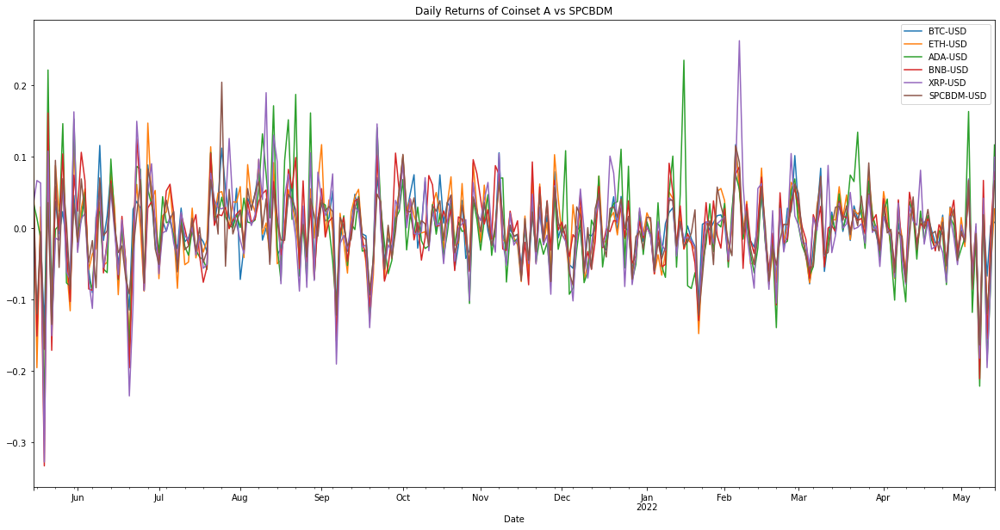

In [238]:
# Plotting the Daily Returns of Coinset A (Veteran Coins) vs the Index 

df_daily_returns.head()
df_daily_returns.plot(figsize=(20, 10), title= "Daily Returns of Coinset A vs SPCBDM")

Coinset B

In [239]:
# Variables
yearly_trading_days = 365 # For Crypto

# Data Frames Needed
#    1. Daily Returns
#    2. Average Annual Returns
#    3. Standard Deviation of Daily Returns
#    4. Sharpe Ratios
#    5. Correlation 


# Daily Returns
# Log of percentage change
df_daily_returns2 = concat_adj_close_df2.pct_change()
df_daily_returns2 = df_daily_returns2.dropna()


# Avg Annual Returns
avg_annual_return2 = df_daily_returns2.mean() * yearly_trading_days
avg_annual_return2.sort_values()


# Annual Returns STDDEV
df_daily_returns_stddev2 = df_daily_returns2.std() * np.sqrt(yearly_trading_days)
df_daily_returns_stddev2.sort_values()


# Sharpe Ratios
sharpe_ratios2 = avg_annual_return2/df_daily_returns_stddev2
sharpe_ratios2.sort_values()


# Plotting the Sharpe Graphs
sharpe_ratios2.sort_values().hvplot.bar(
    hover_color='red',
    title="Coin Portfolio B & SPCBDM Sharpe Ratios"
).opts(
    width=700,
    yformatter='%.0f',
    #color="yellow",
    bgcolor="yellow",
    fontsize={
        'title': 15, 
        'labels': 12, 
    'xticks': 10, 
    'yticks': 10,},
    padding=0.1
)

:Bars   [index]   (0)

<AxesSubplot:title={'center':'Daily Returns of Coinset B vs SPCBDM'}, xlabel='Date'>

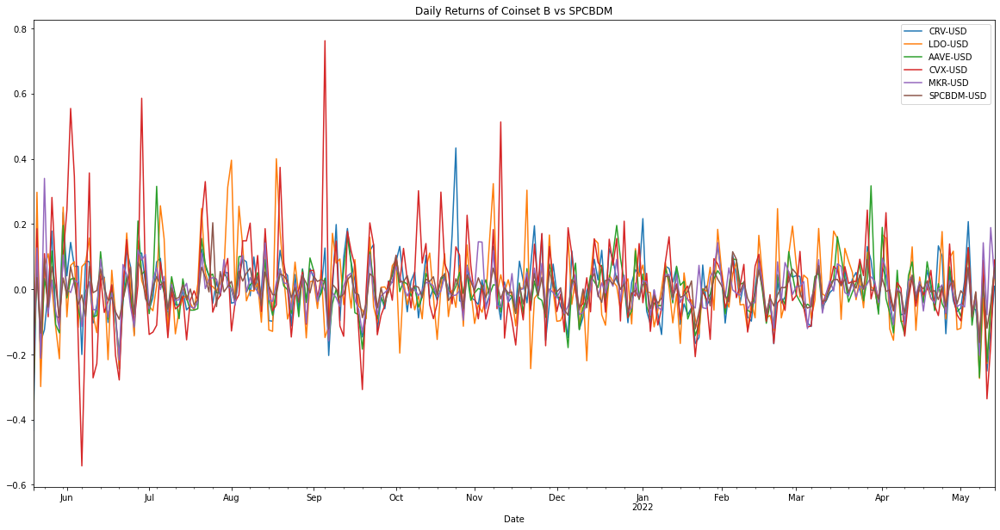

In [240]:
# Plotting the Daily Returns of Coinset A (Veteran Coins) vs the Index 

df_daily_returns2.head()
df_daily_returns2.plot(figsize=(20, 10), title= "Daily Returns of Coinset B vs SPCBDM")

## Brief Note on Correlation

Coinset A

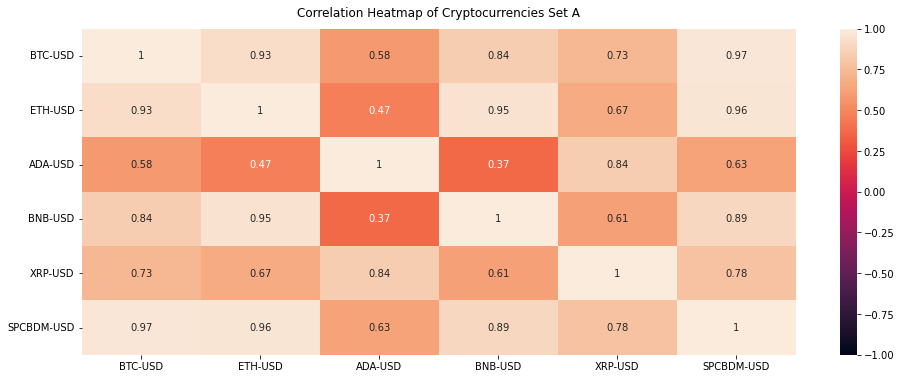

In [241]:
corr_df = concat_adj_close_df.corr(method='pearson')

# reset symbol as index (rather than 0-X)
corr_df.head().reset_index()

# delete corr_df.index.name
corr_df.head(10)

# Plotting heatmap correlation for Coinset A (Veteran Coins)

plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(corr_df, vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap of Cryptocurrencies Set A', fontdict={'fontsize':12}, pad=12);

Coinset B

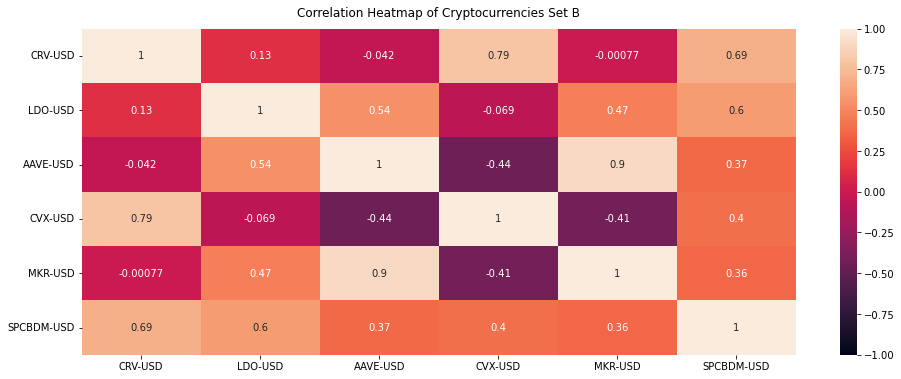

In [242]:
corr_df2 = concat_adj_close_df2.corr(method='pearson')

# reset symbol as index (rather than 0-X)
corr_df2.head().reset_index()

# delete corr_df.index.name
corr_df2.head(10)

# Plotting heatmap correlation for Coinset B (DeFi Coins)

plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(corr_df2, vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap of Cryptocurrencies Set B', fontdict={'fontsize':12}, pad=12);

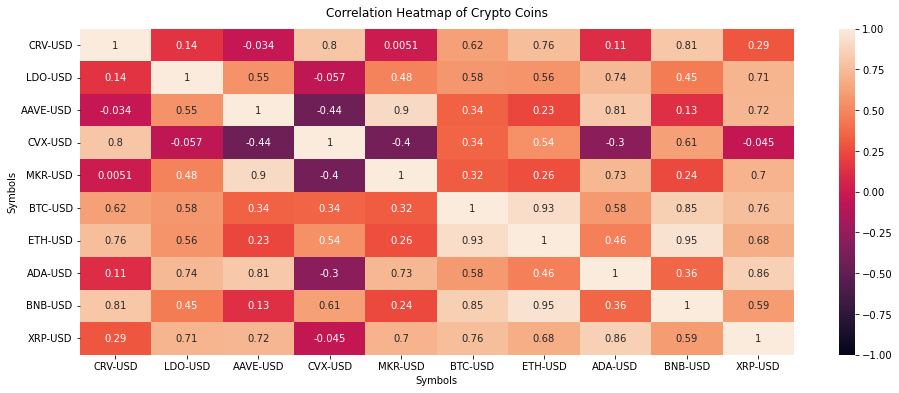

In [243]:
corr_crypto_df = concat_adj_close_df3.corr(method='pearson')

#reset symbol as index (rather than 0-X)
corr_crypto_df.head().reset_index()

#del corr_df.index.name
corr_crypto_df.head(10)

# Plotting heatmap correlation for Coinset A & B 

plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(corr_crypto_df, vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap of Crypto Coins', fontdict={'fontsize':12}, pad=12);


Measure Cumulative Returns of each Set

Set A

In [244]:
# Calculting the Cumulative Daily Returns for Coinset A (Veteran Coins)

cumulative_dailyrtn = (1 + df_daily_returns).cumprod()
cumulative_dailyrtn.tail()



,BTC-USD,ETH-USD,ADA-USD,BNB-USD,XRP-USD,SPCBDM-USD
Date,,,,,,
2022-05-09,0.609,0.604,0.316,0.524,0.363,0.560
2022-05-10,0.624,0.631,0.325,0.559,0.378,0.570
2022-05-11,0.582,0.558,0.265,0.472,0.304,0.502
2022-05-12,0.584,0.528,0.245,0.471,0.283,0.479
2022-05-13,0.589,0.542,0.274,0.509,0.312,0.511


<AxesSubplot:title={'center':'Cumulative Retruns of Coinset A vs SPCBDM'}, xlabel='Date'>

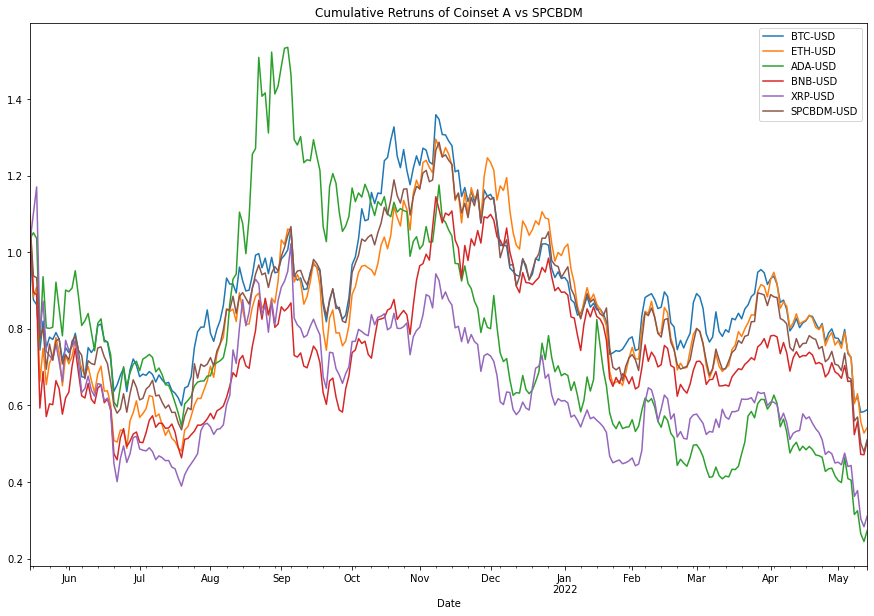

In [245]:
# Plotting the Cumulative Daily Returns for Coinset A (Veteran Coins) vs the Index 

cumulative_dailyrtn.plot(legend="True", figsize=(15, 10), title= "Cumulative Retruns of Coinset A vs SPCBDM")

Set B

In [246]:
# Calculting the cumulative daily returns for Coinset B (DeFi Coins) 

cumulative_dailyrtn2 = (1 + df_daily_returns2).cumprod()
cumulative_dailyrtn2.tail()

,CRV-USD,LDO-USD,AAVE-USD,CVX-USD,MKR-USD,SPCBDM-USD
Date,,,,,,
2022-05-09,0.552,0.499,0.160,2.126,0.229,0.599
2022-05-10,0.568,0.486,0.167,2.316,0.262,0.610
2022-05-11,0.426,0.375,0.130,1.537,0.241,0.537
2022-05-12,0.375,0.348,0.123,1.274,0.287,0.513
2022-05-13,0.378,0.366,0.130,1.389,0.297,0.547


<AxesSubplot:title={'center':'Cumulative Retruns of Coinset B vs SPCBDM'}, xlabel='Date'>

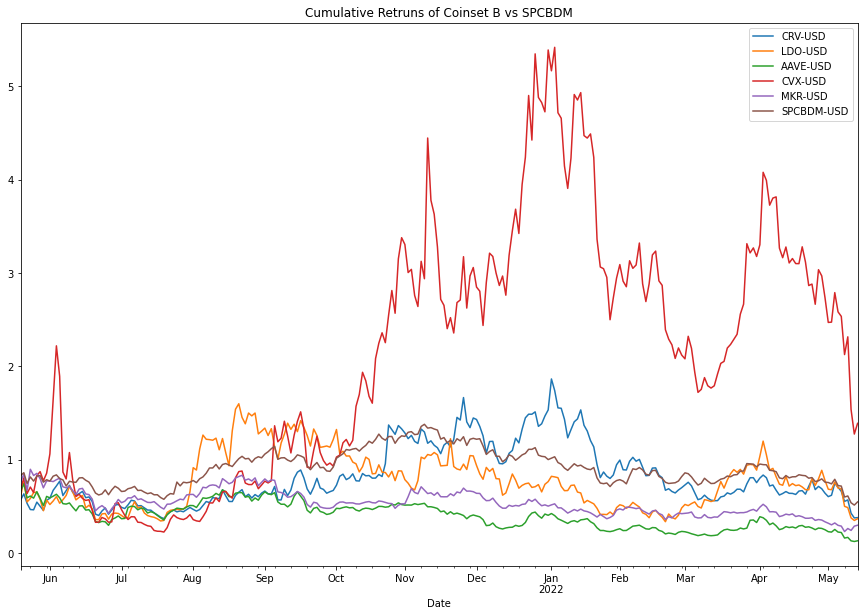

In [247]:
# Plotting the Cumulative Daily Returns for Coinset B (DeFi Coins)

cumulative_dailyrtn2.plot(legend="True", figsize=(15, 10), title= "Cumulative Retruns of Coinset B vs SPCBDM")

# Measure Volatility of each Set vs Index

In [248]:
# Calculating the Standard Deviation for Coinset A (Veteran Coins)

std_pfA = df_daily_returns.std().sort_values()
std_pfA

BTC-USD      0.044
SPCBDM-USD   0.047
ETH-USD      0.056
BNB-USD      0.057
XRP-USD      0.064
ADA-USD      0.066
dtype: float64

In [249]:
# Confirming that the values are sorted in order

df_daily_returns_stddev.sort_values()

BTC-USD      0.843
SPCBDM-USD   0.907
ETH-USD      1.074
BNB-USD      1.094
XRP-USD      1.225
ADA-USD      1.258
dtype: float64

<AxesSubplot:title={'center':'Daily Volatility of Set A vs SPCBDM'}>

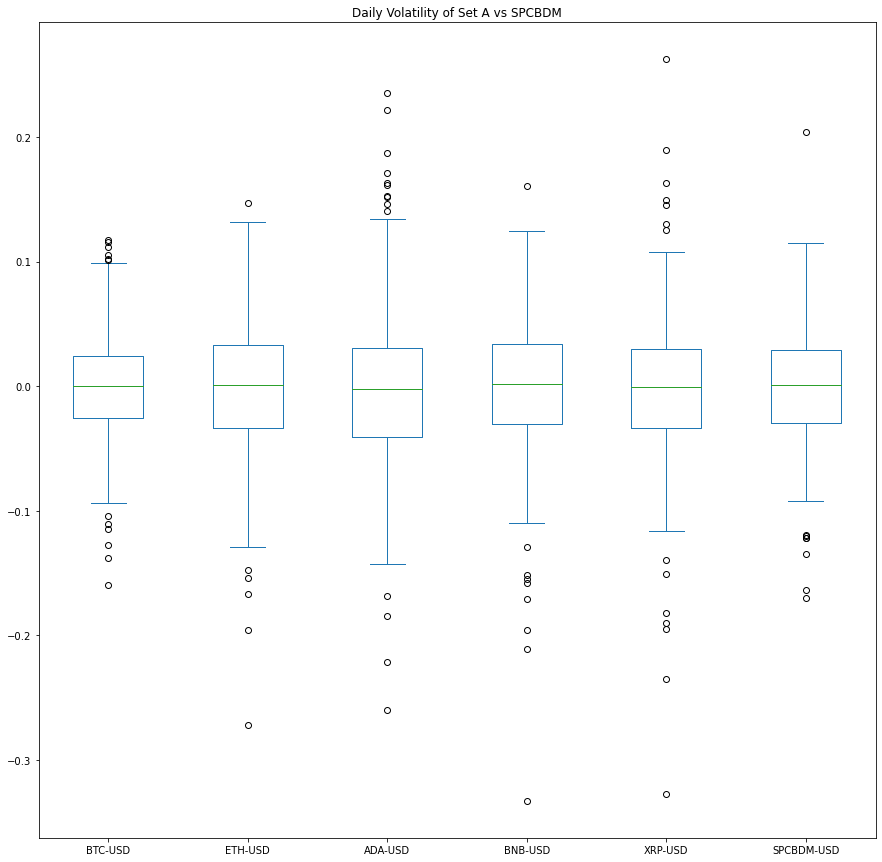

In [250]:
# Plotting the Volatilty of Coinset A vs the SPCBDM index 

df_daily_returns.plot(kind="box", legend="True", figsize=(15, 15), title= "Daily Volatility of Set A vs SPCBDM")

In [251]:
# Calculating the Standard Deviation for Coinset B (DeFi Coins)

std_pfB = df_daily_returns2.std().sort_values()
std_pfB

SPCBDM-USD   0.047
MKR-USD      0.067
AAVE-USD     0.081
CRV-USD      0.094
LDO-USD      0.115
CVX-USD      0.143
dtype: float64

In [252]:
# Confirming that the values are sorted in order

df_daily_returns_stddev2.sort_values()

SPCBDM-USD   0.898
MKR-USD      1.277
AAVE-USD     1.544
CRV-USD      1.786
LDO-USD      2.205
CVX-USD      2.736
dtype: float64

<AxesSubplot:title={'center':'Daily Volatility of Set B vs SPCBDM'}>

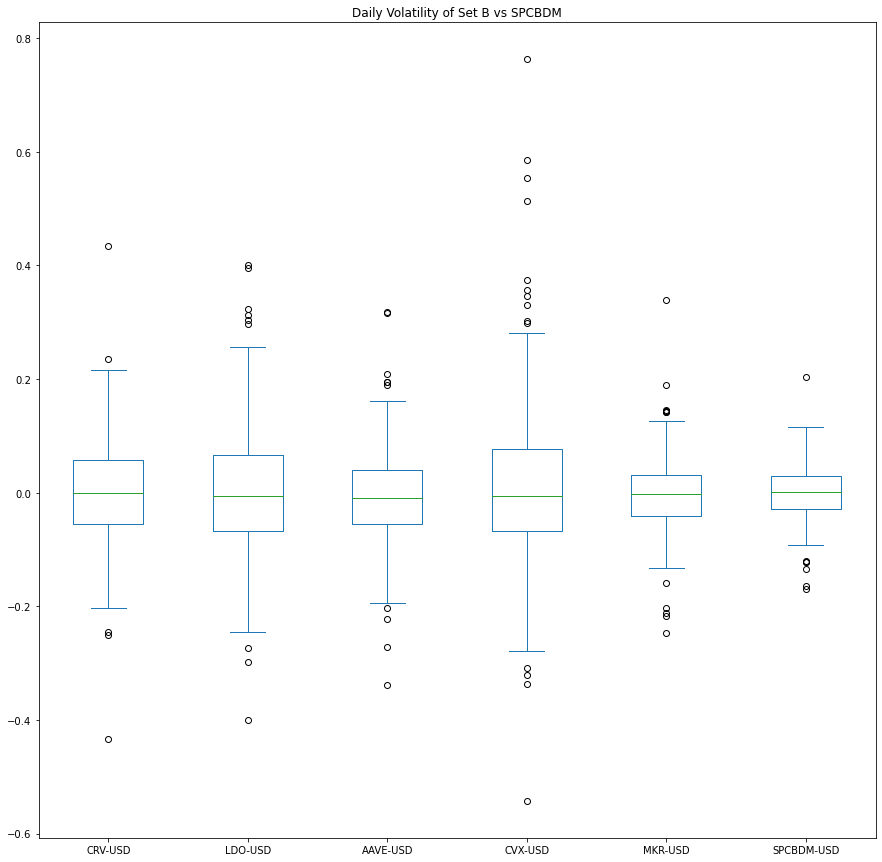

In [253]:
# Plotting the Volatilty of Coinset A vs the SPCBDM index 

df_daily_returns2.plot(kind="box", legend="True", figsize=(15, 15), title= "Daily Volatility of Set B vs SPCBDM")

<AxesSubplot:title={'center':'21-Day Rolling Std Deviation Set A'}, xlabel='Date'>

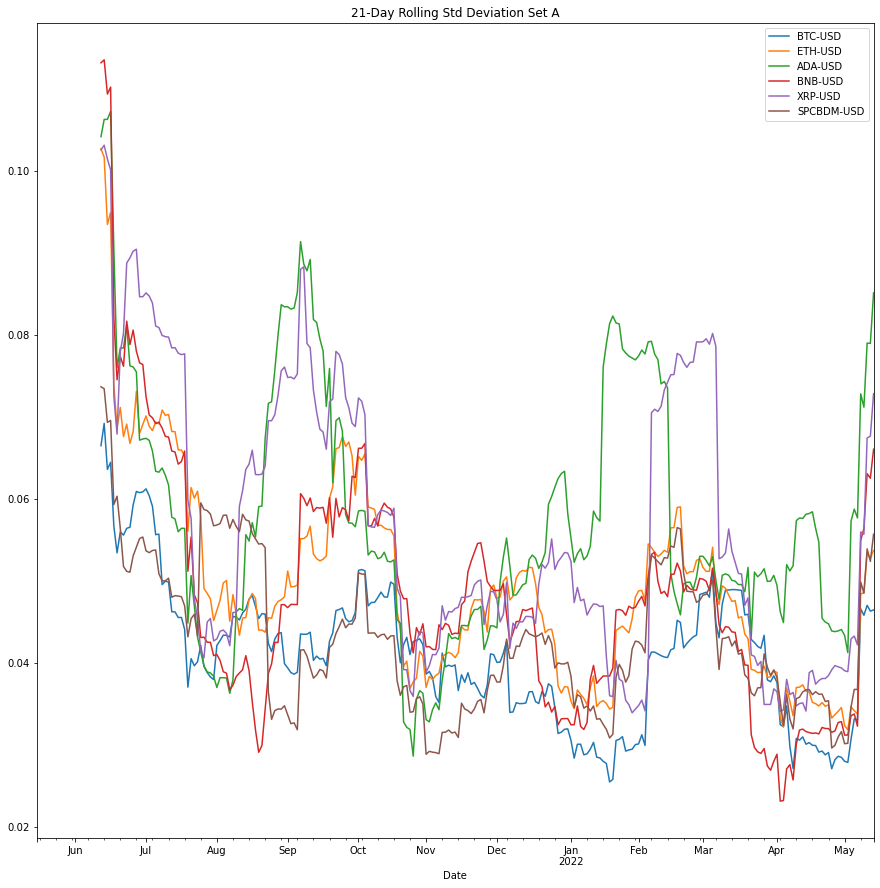

In [254]:
# Plotting the 21 Day Rolling Standard Deviation for Coinset A (Veteran Coins)

df_daily_returns.rolling(window=21).std().plot(legend="True", figsize=(15, 15), title= "21-Day Rolling Std Deviation Set A")

<AxesSubplot:title={'center':'21-Day Rolling Std Deviation Set B'}, xlabel='Date'>

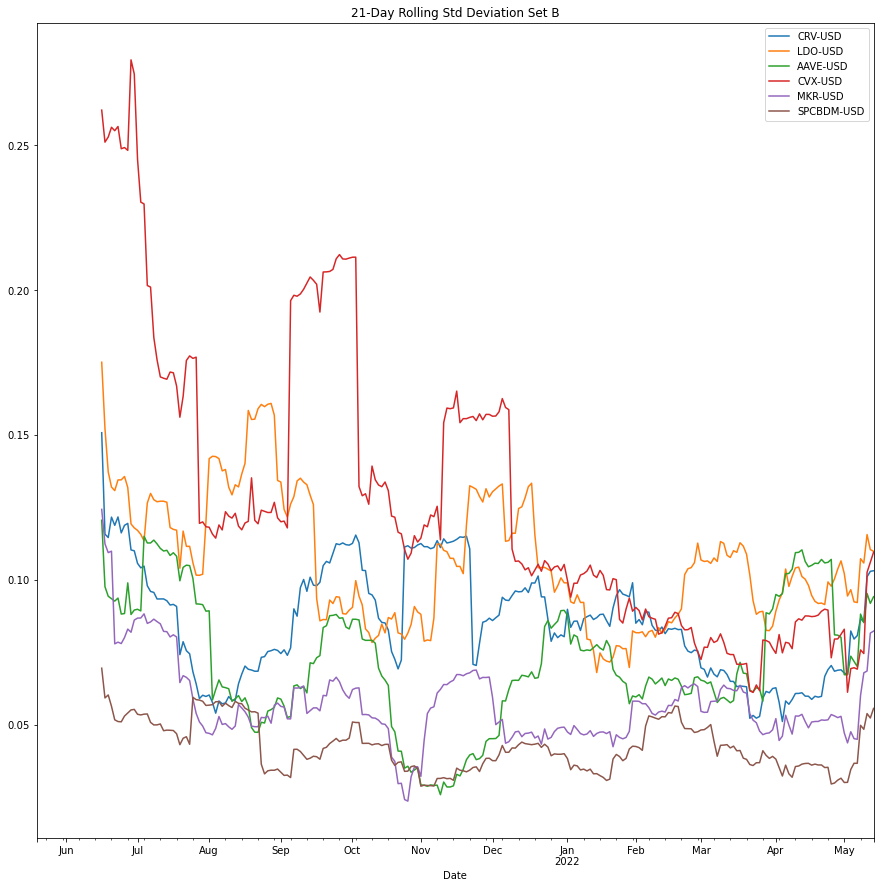

In [255]:
# Plotting the 21 Day Rolling Standard Deviation for Coinset B (DeFi Coins)

df_daily_returns2.rolling(window=21).std().plot(legend="True", figsize=(15, 15), title= "21-Day Rolling Std Deviation Set B")

# Now we calculate the daily returns of our set of coins vs the SPCBDM Index

In [256]:
# Calculating the Daily Returns of Coinset A (Veteran Coins) vs the Index. Dropping all NAN values 

daily_returns_1 = concat_adj_close_df.pct_change().dropna()
daily_returns_1.head()

,BTC-USD,ETH-USD,ADA-USD,BNB-USD,XRP-USD,SPCBDM-USD
Date,,,,,,
2021-05-14,0.003,0.098,0.037,0.055,0.032,0.066
2021-05-17,-0.127,-0.195,0.014,-0.151,0.067,-0.120
2021-05-18,-0.014,0.030,-0.014,-0.008,0.063,-0.005
2021-05-19,-0.138,-0.272,-0.260,-0.333,-0.327,-0.170
2021-05-20,0.102,0.132,0.221,0.161,0.108,0.036


<AxesSubplot:title={'center':'Daily Returns of CoinsetA vs SPCBDM'}, xlabel='Date'>

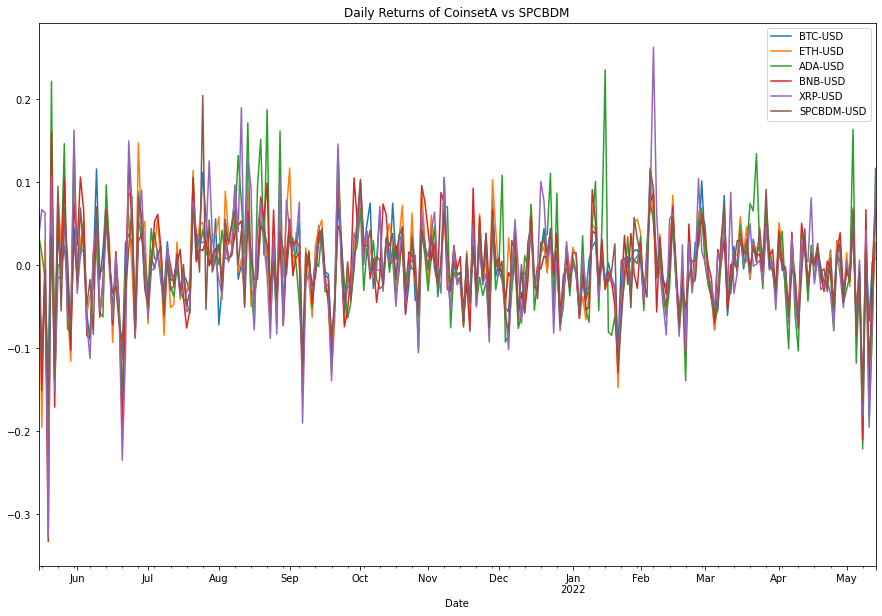

In [257]:
# Plotting the Daily Returns of Coinset A (Veteran Coins) vs the Index 

daily_returns_1.plot(figsize=(15, 10), title= "Daily Returns of CoinsetA vs SPCBDM")

In [258]:
# Calculating the Cumulative Returns for Coinset A (Veteran Coins) vs the Index 

cumulative_dailyrtn = (1 + daily_returns_1).cumprod()
cumulative_dailyrtn.tail()


,BTC-USD,ETH-USD,ADA-USD,BNB-USD,XRP-USD,SPCBDM-USD
Date,,,,,,
2022-05-09,0.609,0.604,0.316,0.524,0.363,0.560
2022-05-10,0.624,0.631,0.325,0.559,0.378,0.570
2022-05-11,0.582,0.558,0.265,0.472,0.304,0.502
2022-05-12,0.584,0.528,0.245,0.471,0.283,0.479
2022-05-13,0.589,0.542,0.274,0.509,0.312,0.511


<AxesSubplot:title={'center':'Cumulative Retruns of Coinset A vs SPCBDM'}, xlabel='Date'>

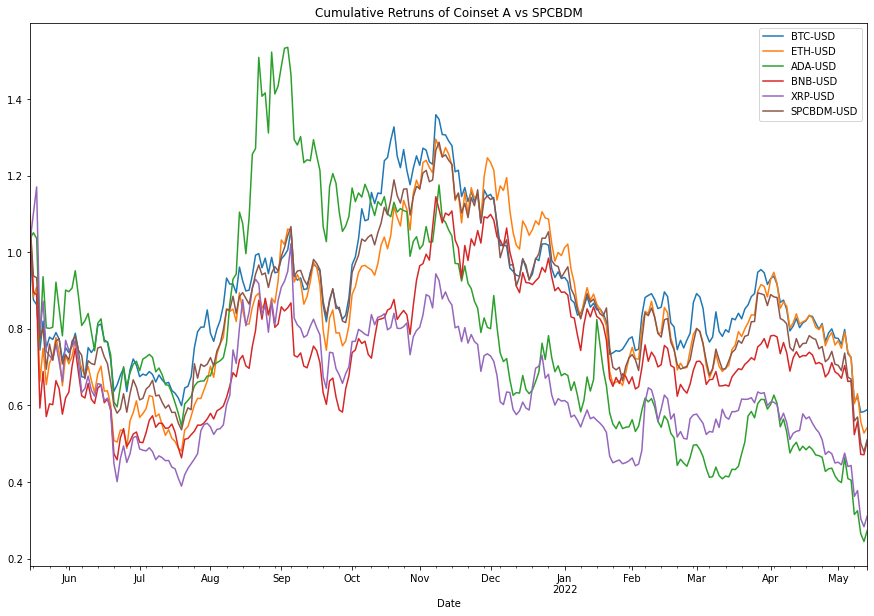

In [259]:
# Plotting the Cumulative Returns for Coinset A vs the Index 

cumulative_dailyrtn.plot(legend="True", figsize=(15, 10), title= "Cumulative Retruns of Coinset A vs SPCBDM")

# Our coins show that they would have outperformed the index, partly due to BNB's run up during 2021. 

In [260]:
# Calculating the average annual return for Coinset A (Veteran Coins)

avg_anl_rtn = daily_returns_1.mean() * 252
avg_anl_rtn.sort_values()

ADA-USD      -0.703
XRP-USD      -0.589
SPCBDM-USD   -0.362
BTC-USD      -0.264
BNB-USD      -0.216
ETH-USD      -0.180
dtype: float64

In [261]:
dict_coinsA = {
    'XRP-USD': avg_anl_rtn['XRP-USD'],
    'SPCBDM-USD': avg_anl_rtn['SPCBDM-USD'],
    'BTC-USD': avg_anl_rtn['BTC-USD'],
    'ADA-USD': avg_anl_rtn['ADA-USD'],
    'ETH-USD': avg_anl_rtn['ETH-USD'],
    'BNB-USD': avg_anl_rtn['BNB-USD']}

print(dict_coinsA)

{'XRP-USD': -0.5891086123414531, 'SPCBDM-USD': -0.3615173893234199, 'BTC-USD': -0.26357199710083945, 'ADA-USD': -0.7026882521881741, 'ETH-USD': -0.18028613525331796, 'BNB-USD': -0.21552051250535362}


In [262]:
df_coins = pd.DataFrame.from_dict({'coin': list(dict_coinsA.keys()), 'rtns': list(dict_coinsA.values())})
display(df_coins.head())

,coin,rtns
0,XRP-USD,-0.589
1,SPCBDM-USD,-0.362
2,BTC-USD,-0.264
3,ADA-USD,-0.703
4,ETH-USD,-0.180


In [263]:
val_index = df_coins.index[df_coins['coin']=='SPCBDM-USD']
value = df_coins.iloc[1]['rtns']
display(f" We want the returns to be greater than: SPCBDM value: {value}")
criteria = df_coins[df_coins.iloc[:, 1] > value]
display(criteria)

' We want the returns to be greater than: SPCBDM value: -0.3615173893234199'

,coin,rtns
2,BTC-USD,-0.264
4,ETH-USD,-0.180
5,BNB-USD,-0.216


# BTC , ADA, ETH, BNB all offered better returns than the index! 
 Now to Coinset B

In [264]:
# Calculating the Daily Returns of Coinset B (Veteran Coins) vs the Index . Dropping all NAN values 

daily_returns_2 = concat_adj_close_df2.pct_change().dropna()
daily_returns_2.head()

,CRV-USD,LDO-USD,AAVE-USD,CVX-USD,MKR-USD,SPCBDM-USD
Date,,,,,,
2021-05-19,-0.434,-0.399,-0.338,-0.321,-0.246,-0.170
2021-05-20,0.118,0.298,0.121,0.186,0.127,0.036
2021-05-21,-0.161,-0.299,-0.203,-0.209,-0.212,-0.135
2021-05-24,-0.124,0.068,0.033,0.109,0.340,0.095
2021-05-25,-0.007,0.109,-0.037,-0.084,-0.075,-0.055


<AxesSubplot:title={'center':'Daily Returns of CoinsetB vs SPCBDM'}, xlabel='Date'>

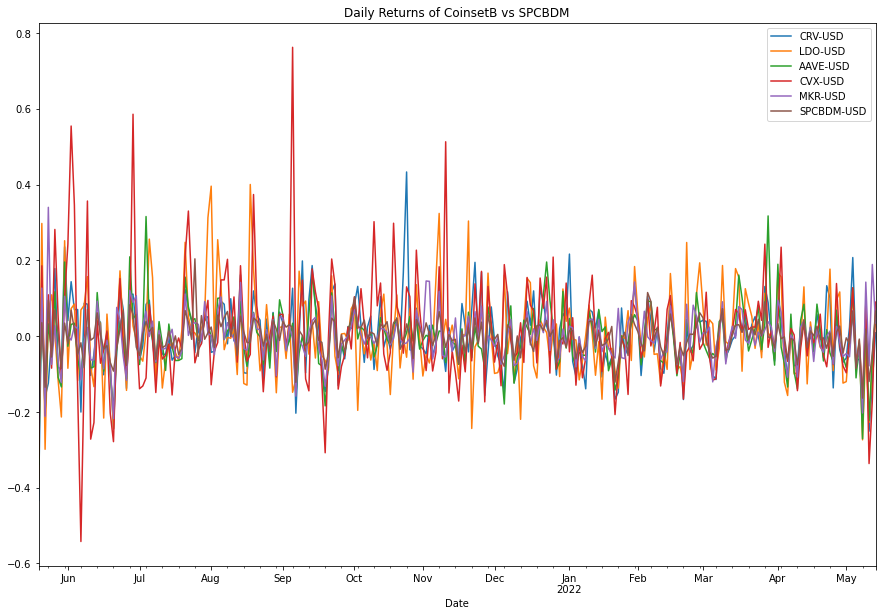

In [265]:
# Plotting the Daily Returns of Coinset B (DeFi Coins) vs the Index 

daily_returns_2.plot(figsize=(15, 10), title= "Daily Returns of CoinsetB vs SPCBDM")

In [266]:
# Calculating the Cumulative Returns of Coinset B (DeFi Coins) vs the Index

cumulative_dailyrtn2 = (1 + daily_returns_2).cumprod()
cumulative_dailyrtn2.tail()


,CRV-USD,LDO-USD,AAVE-USD,CVX-USD,MKR-USD,SPCBDM-USD
Date,,,,,,
2022-05-09,0.552,0.499,0.160,2.126,0.229,0.599
2022-05-10,0.568,0.486,0.167,2.316,0.262,0.610
2022-05-11,0.426,0.375,0.130,1.537,0.241,0.537
2022-05-12,0.375,0.348,0.123,1.274,0.287,0.513
2022-05-13,0.378,0.366,0.130,1.389,0.297,0.547


<AxesSubplot:title={'center':'Cumulative Retruns of Coinset B vs SPCBDM'}, xlabel='Date'>

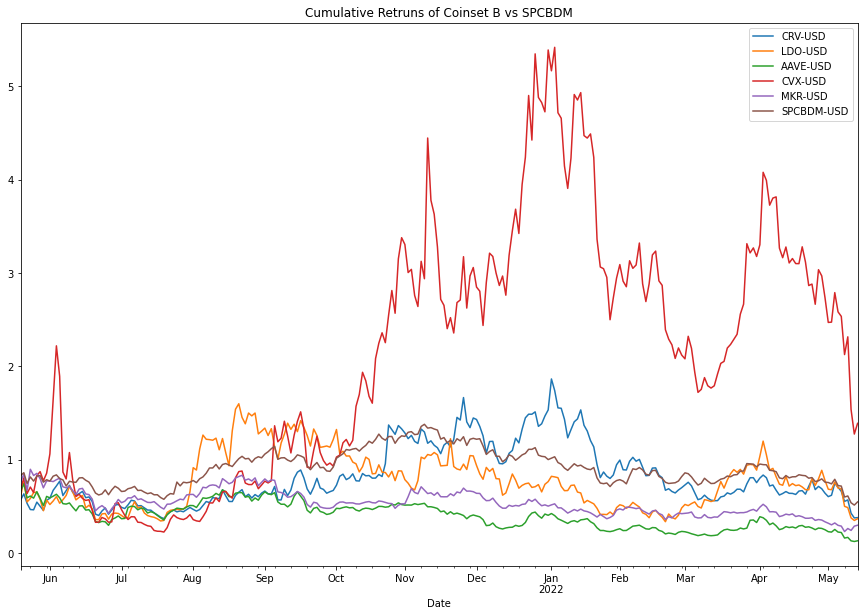

In [267]:
# Plotting the Cumulative Returns of Coinset B (DeFi Coins) vs the Index


cumulative_dailyrtn2.plot(legend="True", figsize=(15, 10), title= "Cumulative Retruns of Coinset B vs SPCBDM")

In [268]:
# Calculating the Average annual return of the DeFi set of coins

avg_anl_rtn2 = daily_returns_2.mean() * 252
avg_anl_rtn2.sort_values()

AAVE-USD     -1.152
MKR-USD      -0.621
SPCBDM-USD   -0.308
CRV-USD       0.177
LDO-USD       0.678
CVX-USD       2.777
dtype: float64

In [269]:
dict_coinsB = {
    'CRV-USD': avg_anl_rtn2['CRV-USD'],
    'SPCBDM-USD': avg_anl_rtn2['SPCBDM-USD'],
    'LDO-USD': avg_anl_rtn2['LDO-USD'],
    'MKR-USD': avg_anl_rtn2['MKR-USD'],
    'AAVE-USD': avg_anl_rtn2['AAVE-USD'],
    'CVX-USD': avg_anl_rtn2['CVX-USD']}

print(dict_coinsB)

{'CRV-USD': 0.1768933442291107, 'SPCBDM-USD': -0.30838446964106037, 'LDO-USD': 0.6782860183010514, 'MKR-USD': -0.6205752250527712, 'AAVE-USD': -1.151680748321952, 'CVX-USD': 2.7771941304192294}


In [270]:
df_coins = pd.DataFrame.from_dict({'coin': list(dict_coinsB.keys()), 'rtns': list(dict_coinsB.values())})
display(df_coins.head())

,coin,rtns
0,CRV-USD,0.177
1,SPCBDM-USD,-0.308
2,LDO-USD,0.678
3,MKR-USD,-0.621
4,AAVE-USD,-1.152


In [271]:
val_index = df_coins.index[df_coins['coin']=='SPCBDM-USD']
value = df_coins.iloc[1]['rtns']
display(f" We want the returns to be greater than: SPCBDM value: {value}")
criteria = df_coins[df_coins.iloc[:, 1] > value]
display(criteria)

' We want the returns to be greater than: SPCBDM value: -0.30838446964106037'

,coin,rtns
0,CRV-USD,0.177
2,LDO-USD,0.678
5,CVX-USD,2.777


# CURVE , LIDO and CONVEX FINANCE offered a better return that the index! 
 Next - We kept the coins that preformed better than the index:

In [272]:
# Creating a dataframe with the final selection of coins that outperformed the index 

coinset_list3 = ['BTC-USD', 'ETH-USD', 'ADA-USD', 'BNB-USD', 'CRV-USD', 'CVX-USD', 'LDO-USD'] 

final_list = cn_close_price_dfer(coinset_list3)

concat_final = pd.concat([final_list, spcbdm_indx], axis=1)

sim_list = final_list.dropna()
sim_index = spcbdm_indx.dropna()

display(sim_list.dropna().head())
display(concat_final.dropna().head())

Symbols,BTC-USD,ETH-USD,ADA-USD,BNB-USD,CRV-USD,CVX-USD,LDO-USD
Date,,,,,,,
2021-05-18,42909.402,3380.070,2.004,508.022,3.488,9.079,4.056
2021-05-19,37002.441,2460.679,1.483,339.025,1.975,6.164,2.436
2021-05-20,40782.738,2784.294,1.810,393.613,2.208,7.308,3.161
2021-05-21,37304.691,2430.621,1.552,326.296,1.851,5.780,2.217
2021-05-22,37536.633,2295.706,1.464,299.504,1.625,5.657,1.975


,BTC-USD,ETH-USD,ADA-USD,BNB-USD,CRV-USD,CVX-USD,LDO-USD,SPCBDM-USD
Date,,,,,,,,
2021-05-18,42909.402,3380.070,2.004,508.022,3.488,9.079,4.056,4508.390
2021-05-19,37002.441,2460.679,1.483,339.025,1.975,6.164,2.436,3743.390
2021-05-20,40782.738,2784.294,1.810,393.613,2.208,7.308,3.161,3876.760
2021-05-21,37304.691,2430.621,1.552,326.296,1.851,5.780,2.217,3354.100
2021-05-24,38705.980,2643.591,1.549,345.310,1.622,6.411,2.368,3672.130


In [273]:
cols = pd.MultiIndex.from_tuples([('BTC-USD', 'close'),
                                  ('ETH-USD', 'close'),
                                  ('ADA-USD', 'close'),
                                  ('BNB-USD', 'close'),
                                  ('CRV-USD', 'close'),
                                  ('CVX-USD', 'close'),
                                  ('LDO-USD', 'close')])
                            
                        


In [274]:
sim_list.columns = cols

In [275]:
pfsim = MCSimulation(
    portfolio_data = sim_list,
    num_simulation =1000,
    weights = [.16, .14, .14, .14, .14, .14,.14],
    num_trading_days = 365
)

In [276]:
pfsim.portfolio_data.head()

BTC-USD               ETH-USD              ADA-USD               \
               close daily_return    close daily_return   close daily_return   
Date                                                                           
2021-05-18 42909.402          NaN 3380.070          NaN   2.004          NaN   
2021-05-19 37002.441       -0.138 2460.679       -0.272   1.483       -0.260   
2021-05-20 40782.738        0.102 2784.294        0.132   1.810        0.221   
2021-05-21 37304.691       -0.085 2430.621       -0.127   1.552       -0.143   
2021-05-22 37536.633        0.006 2295.706       -0.056   1.464       -0.057   

           BNB-USD              CRV-USD              CVX-USD               \
             close daily_return   close daily_return   close daily_return   
Date                                                                        
2021-05-18 508.022          NaN   3.488          NaN   9.079          NaN   
2021-05-19 339.025       -0.333   1.975       -0.434   6.164       -0.321   
2021-05-20 393.613        0.161   2.208        0.118   7.308        0.186   
2021-05-21 326.296       -0.171   1.851       -0.161   5.780       -0.209   
2021-05-22 299.504       -0.082   1.625       -0.122   5.657       -0.021   

           LDO-USD               
             close daily_return  
Date                             
2021-05-18   4.056          NaN  
2021-05-19   2.436       -0.399  
2021-05-20   3.161        0.298  
2021-05-21   2.217       -0.299  
2021-05-22   1.975       -0.109

In [277]:
pfsim.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.


C:\Users\barkf\Fintech2022jptr\project\Project-1-Files-main\Final\MCForecastTools.py:117: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  portfolio_cumulative_returns[n] = (1 + sim_df.fillna(0)).cumprod()


Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo simulation number 230.
Running Monte Carlo simulation number 240.
Running Monte Carlo simulation number 250.
Running Monte Carlo simulation number 260.
Running Monte Carlo simulation number 270.
Running Monte Carlo simulation number 280.
Running Monte Carlo simulation number 290.
Running Monte Carlo simulation number 300.
Running Monte Carlo simulation number 310.
Running Monte Carlo simulation number 320.
Running Monte Carlo simulation number 330.
Running Mon

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,...,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000
1,0.982,0.962,0.967,1.027,1.040,1.002,0.997,0.981,1.029,0.970,...,1.004,1.015,1.001,1.018,1.011,0.927,1.020,1.027,0.975,1.001
2,1.013,0.940,0.983,1.035,1.032,1.016,1.008,0.974,1.048,0.993,...,0.986,1.068,0.980,0.981,1.037,0.907,1.022,1.020,1.002,1.022
3,0.996,0.957,1.012,1.022,0.991,1.057,1.022,0.953,1.067,0.996,...,1.015,1.112,0.993,0.968,1.047,0.929,0.986,1.031,1.073,1.048
4,1.013,0.960,1.033,1.010,0.963,1.045,1.001,0.940,1.068,0.983,...,0.993,1.170,1.022,0.972,1.081,0.919,1.001,0.972,1.030,0.986
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
361,1.401,2.485,1.191,2.127,0.819,3.183,0.817,4.618,0.924,0.843,...,1.306,2.365,0.793,2.967,1.128,1.435,1.646,1.863,0.747,2.002
362,1.404,2.557,1.158,2.000,0.758,3.257,0.797,4.626,0.908,0.816,...,1.252,2.379,0.841,3.031,1.105,1.496,1.600,1.854,0.752,2.047
363,1.415,2.585,1.204,1.963,0.770,3.352,0.763,4.512,0.926,0.835,...,1.265,2.437,0.849,2.850,1.114,1.502,1.588,1.801,0.743,2.057
364,1.374,2.425,1.189,1.986,0.760,3.339,0.775,4.522,0.905,0.860,...,1.227,2.387,0.862,2.855,1.107,1.497,1.580,1.670,0.729,2.107


Next we ran a simulation for 1 year worth of returns:

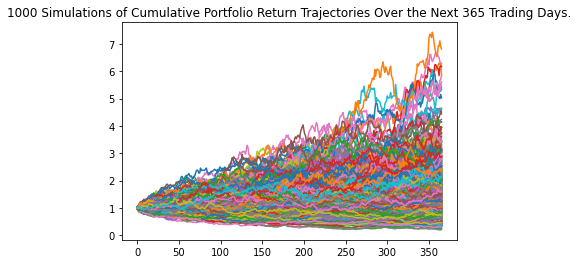

In [278]:
line_plot = pfsim.plot_simulation()

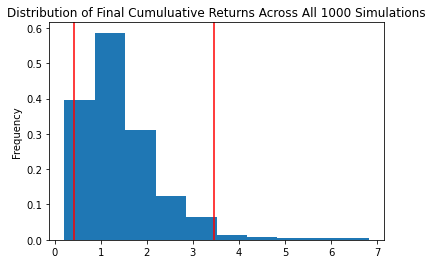

In [279]:
pfsim_dist = pfsim.plot_distribution()

In [280]:
sim_rtn_data = {
    "mean": list(pfsim.simulated_return.mean(axis=1)),
    "median": list(pfsim.simulated_return.median(axis=1)),
    "min": list(pfsim.simulated_return.min(axis=1)),
    "max": list(pfsim.simulated_return.max(axis=1))
}

sim_rtn = pd.DataFrame(sim_rtn_data)

# Sample data
sim_rtn.head()

,mean,median,min,max
0,1.000,1.000,1.000,1.000
1,1.001,1.002,0.912,1.083
2,1.003,1.004,0.830,1.125
3,1.006,1.005,0.847,1.190
4,1.005,1.002,0.835,1.237


<AxesSubplot:title={'center':'Simulated Daily Returns Behavior Of Our Coin Portfolio Over the Next Year'}>

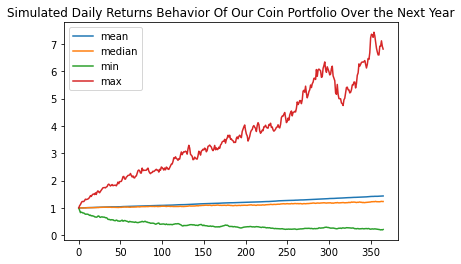

In [281]:
sim_rtn.plot(title="Simulated Daily Returns Behavior Of Our Coin Portfolio Over the Next Year")

Simulated Profits/Losses of $100,000 Investment in our Coin selection Over the Next 252 Trading Days

In [282]:
initial_investment = 100000

cumulative_pnl = initial_investment * sim_rtn

cumulative_pnl.head()

,mean,median,min,max
0,100000.000,100000.000,100000.000,100000.000
1,100137.523,100152.143,91205.332,108330.046
2,100347.743,100374.459,82978.200,112545.670
3,100595.939,100509.155,84662.149,118987.831
4,100488.956,100167.063,83525.210,123718.831


<AxesSubplot:title={'center':'Simulated Outcomes Behavior Of Our Coin Portfolio Over the Next Year'}>

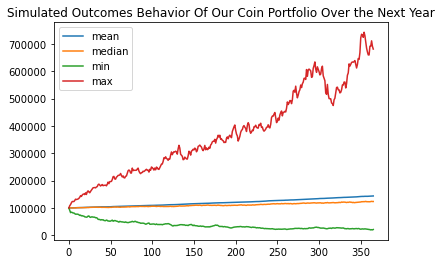

In [283]:
cumulative_pnl.plot(title="Simulated Outcomes Behavior Of Our Coin Portfolio Over the Next Year")

In [284]:
tbl = pfsim.summarize_cumulative_return()

# summary statistics
print(tbl)

count          1000.000
mean              1.439
std               0.847
min               0.213
25%               0.859
50%               1.237
75%               1.754
max               6.811
95% CI Lower      0.433
95% CI Upper      3.451
Name: 365, dtype: float64


In [285]:
ci_lower = round(tbl[8]*100000,2)
ci_upper = round(tbl[9]*100000,2)

# results
print(f"There is a 95% chance that an initial investment of $100,000 in the portfolio"
      f" over the next year will end within the range of"
      f" ${ci_lower} and ${ci_upper}.")

There is a 95% chance that an initial investment of $100,000 in the portfolio over the next year will end within the range of $43306.06 and $345077.18.


# Now we repeat for our Index  
There will be no notes as the process is the same

In [286]:
cols2 = pd.MultiIndex.from_tuples([('SPCBDM-USD', 'close')])

spcbdm_indx.columns = cols2

In [304]:
indxsim = MCSimulation(
    portfolio_data = spcbdm_indx,
    num_simulation =1000,
    weights = [1],
    num_trading_days = 365
)

In [305]:
indxsim.portfolio_data.head()

SPCBDM-USD             
                close daily_return
Date                              
2021-05-13   4828.860          NaN
2021-05-14   5148.730        0.066
2021-05-17   4530.050       -0.120
2021-05-18   4508.390       -0.005
2021-05-19   3743.390       -0.170

In [306]:
indxsim.calc_cumulative_return() 

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.


C:\Users\barkf\Fintech2022jptr\project\Project-1-Files-main\Final\MCForecastTools.py:117: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  portfolio_cumulative_returns[n] = (1 + sim_df.fillna(0)).cumprod()


Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo simulation number 230.
Running Monte Carlo simulation number 240.
Running Monte Carlo simulation number 250.
Running Monte Carlo simulation number 260.
Running Monte Carlo simulation number 270.
Running Monte Carlo simulation number 280.
Running Monte Carlo simulation number 290.
Running Monte Carlo simulation number 300.
Running Monte Carlo simulation number 310.
Running Monte Carlo simulation number 320.
Running Monte Carlo simulation number 330.
Running Mon

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,...,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000
1,0.997,0.991,0.950,0.953,1.078,1.003,1.064,0.855,1.038,0.966,...,0.937,0.988,0.845,0.993,1.009,0.987,1.013,1.039,1.040,1.008
2,0.988,0.993,0.943,0.936,1.072,0.958,1.085,0.855,1.019,0.917,...,0.965,1.026,0.893,0.956,0.907,0.982,0.960,1.005,0.954,0.935
3,1.020,0.998,0.881,0.923,1.078,0.950,1.111,0.880,1.017,0.889,...,0.995,1.076,0.936,0.926,0.872,1.010,0.940,1.059,0.970,0.974
4,1.085,0.967,0.813,0.951,1.067,0.918,1.181,0.890,1.060,0.910,...,0.976,1.055,0.930,0.879,0.897,0.953,0.933,0.999,0.991,0.984
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
361,0.611,0.689,0.093,0.123,0.354,0.416,0.324,1.191,0.732,0.920,...,0.592,0.213,0.310,0.214,0.283,0.062,0.234,0.363,0.675,0.820
362,0.626,0.716,0.094,0.113,0.368,0.411,0.326,1.237,0.737,1.023,...,0.598,0.207,0.325,0.212,0.299,0.063,0.232,0.371,0.714,0.813
363,0.652,0.784,0.101,0.109,0.370,0.405,0.325,1.199,0.706,0.934,...,0.596,0.212,0.333,0.196,0.303,0.066,0.244,0.386,0.750,0.852
364,0.631,0.821,0.107,0.115,0.371,0.426,0.326,1.230,0.682,0.938,...,0.626,0.195,0.323,0.207,0.291,0.066,0.238,0.377,0.689,0.886


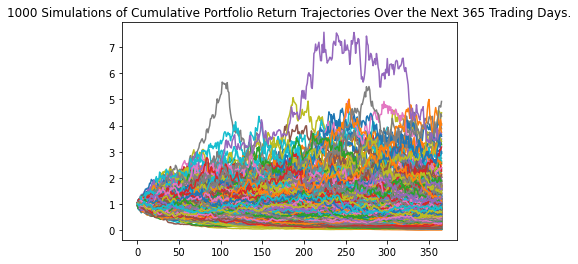

In [307]:
line_plot = indxsim.plot_simulation()

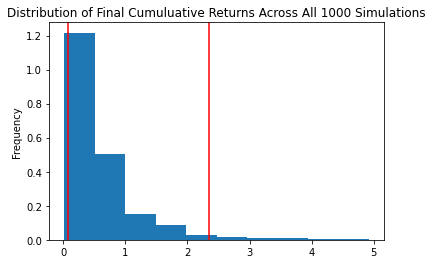

In [308]:
pfsim_dist = indxsim.plot_distribution() 


In [309]:
sim_rtn_data2 = {
    "mean": list(indxsim.simulated_return.mean(axis=1)),
    "median": list(indxsim.simulated_return.median(axis=1)),
    "min": list(indxsim.simulated_return.min(axis=1)),
    "max": list(indxsim.simulated_return.max(axis=1))
}

sim_rtn2 = pd.DataFrame(sim_rtn_data2)

# Sample data for index
sim_rtn2.head()

,mean,median,min,max
0,1.000,1.000,1.000,1.000
1,0.998,0.998,0.816,1.166
2,0.995,0.992,0.781,1.199
3,0.994,0.992,0.757,1.228
4,0.992,0.990,0.711,1.323


<AxesSubplot:title={'center':'Simulated Daily Returns Behavior of our Index Over the Next Year'}>

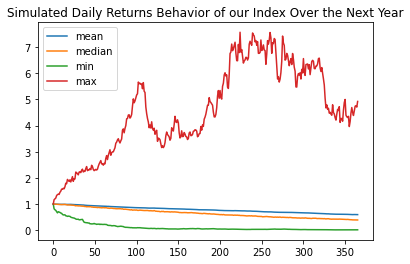

In [310]:
sim_rtn2.plot(title="Simulated Daily Returns Behavior of our Index Over the Next Year")

In [311]:
# 100,000 investment
cumulative_pnl2 = initial_investment * sim_rtn2

cumulative_pnl2.head()

,mean,median,min,max
0,100000.000,100000.000,100000.000,100000.000
1,99808.963,99763.909,81626.013,116600.361
2,99511.452,99209.541,78104.595,119905.416
3,99438.929,99214.916,75731.051,122792.931
4,99179.061,99021.129,71121.409,132256.468


<AxesSubplot:title={'center':'Simulated Outcomes Behavior Of Our Index Over the Next Year'}>

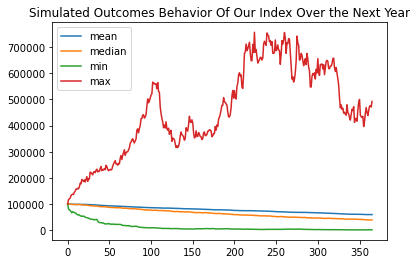

In [312]:
cumulative_pnl2.plot(title="Simulated Outcomes Behavior Of Our Index Over the Next Year")

In [313]:
tbl2 = indxsim.summarize_cumulative_return()

# summary statistics
print(tbl2)

count          1000.000
mean              0.596
std               0.623
min               0.014
25%               0.217
50%               0.390
75%               0.736
max               4.922
95% CI Lower      0.067
95% CI Upper      2.352
Name: 365, dtype: float64


In [314]:
ci_lower2 = round(tbl2[8]*100000,2)
ci_upper2 = round(tbl2[9]*100000,2)

# results
print(f"There is a 95% chance that an initial investment of $100,000 in the index"
      f" over the next year will end within the range of"
      f" ${ci_lower2} and ${ci_upper2}.")

There is a 95% chance that an initial investment of $100,000 in the index over the next year will end within the range of $6733.05 and $235207.39.


# Now for the conclusion statement:

In [316]:
if (ci_upper > ci_upper2) and (ci_lower > ci_lower2):
    print("As seen by our projections, the Coin Model has outperformed the Index")
else:
    print("The Index outperformed the coins")
    

As seen by our projections, the Coin Model has outperformed the Index


Note:
As crypto is traded 365 days, we used the same number for our index although it is only traded 252 days.
When using their actual trading days, our coin set model outperfomed the index significantly more.